In [245]:
import pathlib
from sklearn import model_selection
import sklearn
import json
import matplotlib.pyplot as plt
import json
import numpy as np
import cv2
import tensorflow as tf

In [275]:
from IPython.display import clear_output
max_bbox = 0
js_files = list(pathlib.Path(r'C:\Users\Atlas\Desktop\Sinalboard_OCR\dataset\train\label\custom').iterdir())
for i,js in enumerate(js_files):
    print(i)
    label = json.loads(js.read_text(encoding='utf8'))
    
    if len([x for x in label['bboxes'] if x['group'] != 1]) > max_bbox:
        max_bbox = len([x for x in label['bboxes'] if x['group'] != 1])
        max_bbox_label = label
    
    clear_output(wait=True)
print('Finish')

Finish


In [277]:
max_bbox_label

{'ImageName': 'img_7626.jpg',
 'ImageHeight': 1365,
 'ImageWidth': 1024,
 'bboxes': [{'text': '###',
   'group': 255,
   'points': [[0.00390625, 0.3684981684981685],
    [0.029296875, 0.37435897435897436],
    [0.0234375, 0.4256410256410256],
    [0.0009765625, 0.4146520146520147]],
   'center': [0.014404296875, 0.3957875457875458],
   'xywh': [0.015625, 0.39743589743589747, 0.029296875, 0.05787545787545788]},
  {'text': '中',
   'group': 1,
   'points': [[0.0068359375, 0.3076923076923077],
    [0.0322265625, 0.3201465201465201],
    [0.029296875, 0.3684981684981685],
    [0.00390625, 0.3575091575091575]],
   'center': [0.01806640625, 0.3384615384615385],
   'xywh': [0.0185546875,
    0.3384615384615385,
    0.029296875,
    0.06153846153846154]},
  {'text': '',
   'group': 5,
   'points': [[0.0, 0.43736263736263736],
    [0.0390625, 0.4622710622710623],
    [0.0380859375, 0.473992673992674],
    [0.0, 0.45054945054945056]],
   'center': [0.019287109375, 0.45604395604395603],
   'xywh':

In [254]:
x = np.arange(1,9)[None,:,None].astype(float)

In [260]:
x

array([[[1.],
        [2.],
        [3.],
        [4.],
        [5.],
        [6.],
        [7.],
        [8.]]])

In [264]:
tf.keras.layers.AveragePooling1D(2,2,'valid')(x)

<tf.Tensor: shape=(1, 4, 1), dtype=float32, numpy=
array([[[1.5],
        [3.5],
        [5.5],
        [7.5]]], dtype=float32)>

In [ ]:
#<<1024
#3=1+1+1
#5=3+1+1
#7=5+1+1
#9=7+1+1
#10=9+1 << 512
#14=10+2+2
#16=14+2 << 256
#24=16+4+4
#32=24+4+4
#36=32+4 (32=8*4) <<128 -------------OUTPUT  (size: 0-36 pixel)
#52=36+8+8
#68=52+8+8
#76=68+8 (64=16*4) <<64 -------------OUTPUT  (size: 37-76 pixel)
#108=76+16+16
#140=108+16+16
#156=140+16 (128=32*4) <<32 -------------OUTPUT  (size: 77-156 pixel)
#220=156+32+32
#284=220+32+32
#316=284+32 (256=64*4) <<16 -------------OUTPUT  (size: 157-316 pixel)
#444=316+64+64
#572=444+64+64
#572+64=636 (512=128*4) <<8 -------------OUTPUT  (size: 317-636 pixel)
#636+128+128=892 <<8 -------------OUTPUT  (size: 637-892 pixel)
#892+128+128=1020 <<8 -------------OUTPUT  (size: 892-1024 pixel)

In [ ]:
tf.keras.layers.ZeroPadding((1,1),(1,1))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


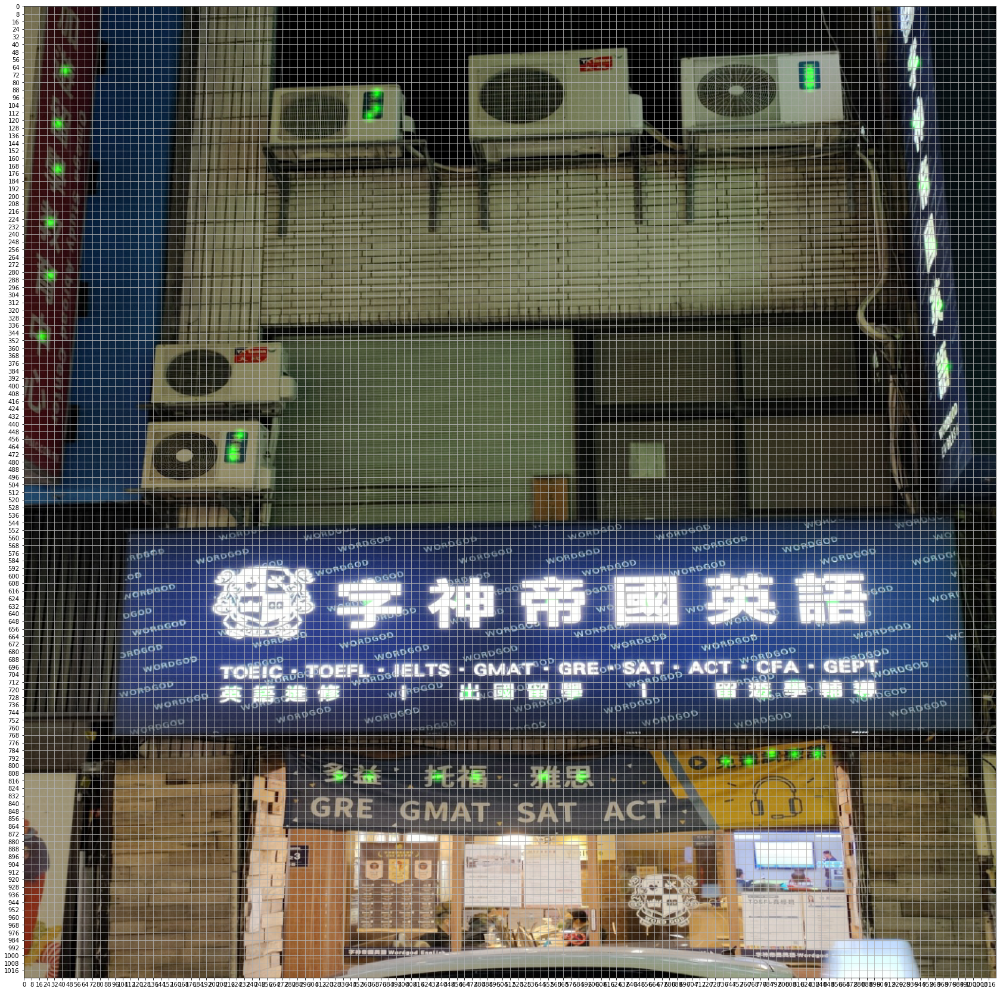

In [285]:
number = 7626
label = json.loads(pathlib.Path(r'C:\Users\Atlas\Desktop\Sinalboard_OCR\dataset\train\label\custom').joinpath(f'img_{number}.json').read_text())
img = plt.imread(pathlib.Path(r'C:\Users\Atlas\Desktop\Sinalboard_OCR\dataset\train\image\official').joinpath(f'img_{number}.jpg'))

k = 1024//8
p = np.zeros((128,128,3),dtype=int)
center = np.array([b['xywh'][0:2] for b in label['bboxes'] if b['group']==1])
center = (center*128).astype(int)
p[center[:,1],center[:,0]] = 255
p[:,:,2] = 0
p[:,:,0] = 0

plt.figure(figsize=(30,30))
plt.xticks(np.arange(0,1024,1024//k))
plt.yticks(np.arange(0,1024,1024//k))
plt.grid(True)
plt.imshow(cv2.resize(img,(1024,1024)).astype(int)+cv2.resize(p.astype(np.uint8),(1024,1024)).astype(int))

In [2]:
import tensorflow as tf

In [40]:
img = img[:1024,:1024]

In [45]:
img.shape

(1024, 1024, 3)

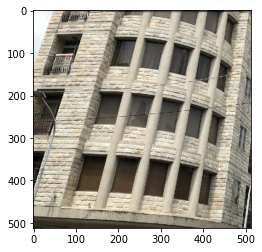

In [53]:
plt.imshow(grid[1,0,...])

In [50]:
grid = np.reshape(img,(2,512,2,512,3))
grid = np.transpose(grid,[0,2,1,3,4])

In [27]:
simg = img[None,:,:,:]
simg = tf.keras.layers.AveragePooling2D(2,2)(simg/255)
simg.shape

TensorShape([1, 512, 682, 3])

In [ ]:
np.reshape()

In [35]:
p = np.zeros((32,32))

In [36]:
p[5,4] = 1

In [ ]:
np.reshape()

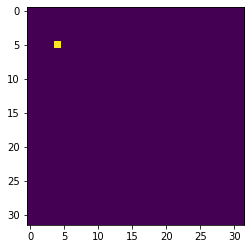

In [37]:
plt.imshow(p)

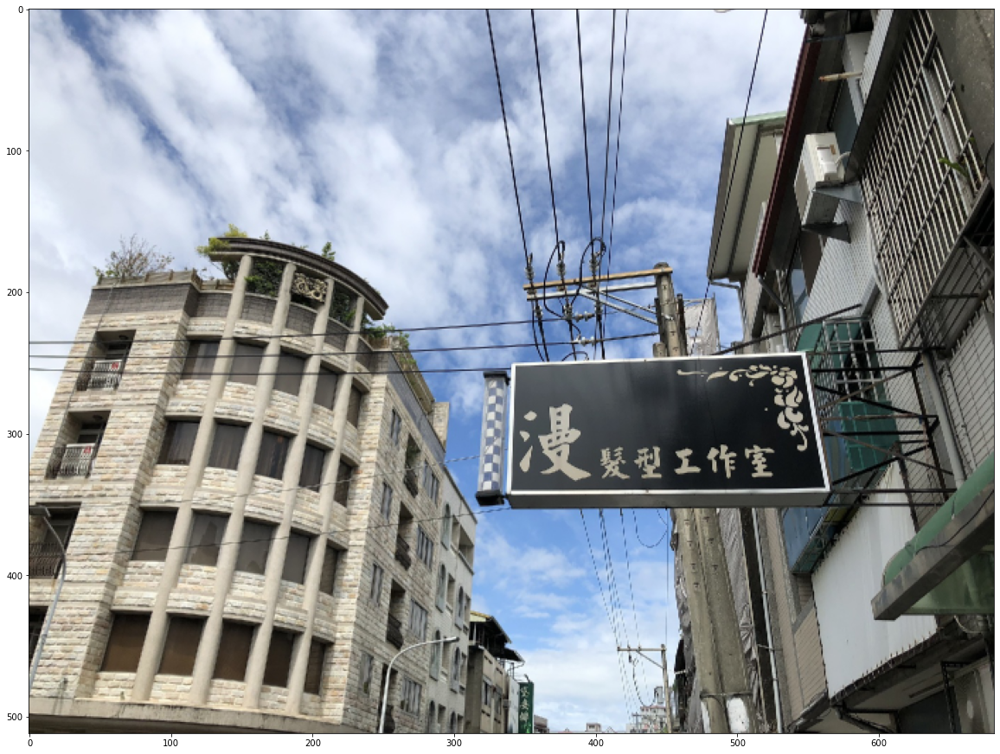

In [28]:
plt.figure(figsize=(20,20))
plt.imshow(simg[0])

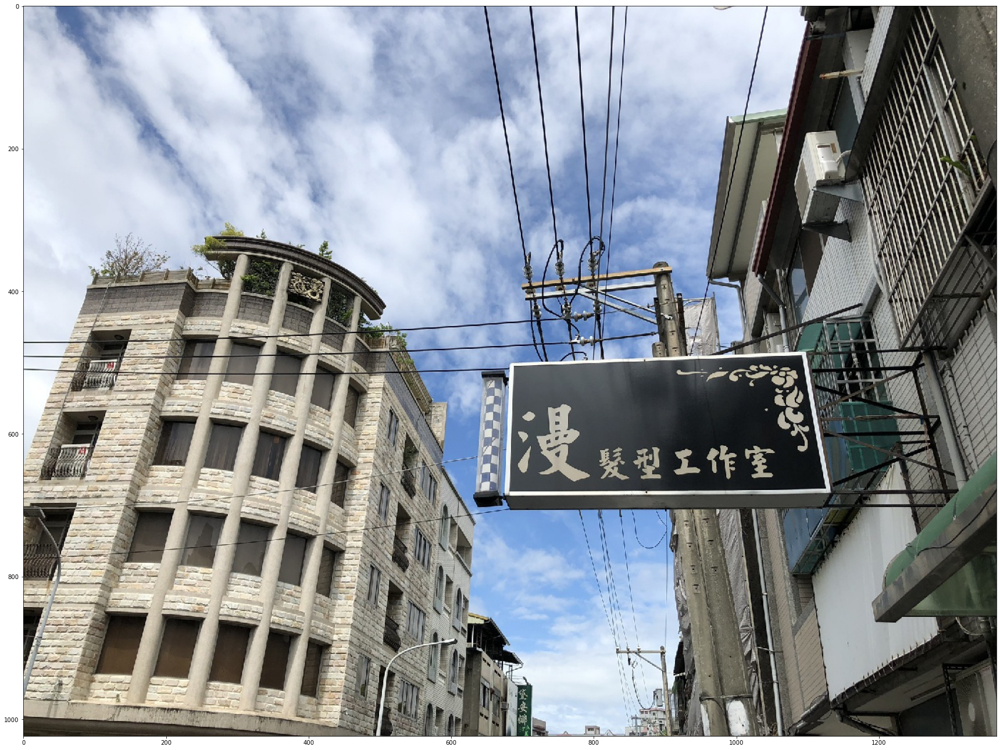

In [30]:
plt.figure(figsize=(30,30))
plt.imshow(img)

In [ ]:
def get_dataset(label_path,image_path,batch_size,validation_ratio,random_state):
    label_paths = list(pathlib.Path(label_path).iterdir())
    train_label_paths, validation_label_paths = model_selection.train_test_split(
        label_paths,
        test_size=validation_ratio,
        random_state=random_state)
    train_data = Dataset(train_label_paths,image_path,batch_size,False)
    validation_data = Dataset(validation_label_paths,image_path,batch_size,True)
    return train_data, validation_data

In [ ]:
class Base:
    def __init__(self,image_path,batch_size):
        self.image_path = pathlib.Path(image_path)
        self.batch_size = batch_size
        
    def get_image(self,path,arg):
        image = self.read_image(path)
#         if arg:
#             image = self.image_arg(image)
        image = self.to_output_image(image)
        return image

    def read_image(self,path):
        image = plt.imread(path)
        image = image.astype(int)
        return image
    
    def to_output_image(self,image):
        image = cv2.resize(image,INVARIANT.DATASET_IMAGE_SHAPE,interpolation=cv2.INTER_LINEAR)
        return image
        

In [ ]:
class Dataset(Base):
    def __init__(self,label_paths,image_path,batch_size,is_validation):
        super().__init__(image_path,batch_size)
        self.label_paths = label_paths
        
    def __iter__(self):
        self.count = 0
        if not self.is_validation:
            self.label_paths = sklearn.utils.shuffle(self.label_paths)
        return self

    def __next__(self):
        if self.count < self.table.index.size:
            batch_image = []
            batch_xywh = []
            batch_offset = []
            batch_bboxes_count = []
            for label_path in self.label_paths[self.count:self.count+self.batch_size]:
                label = json.loads(label_path.read_text(encoding='utf8'))
                image_path = self.image_path.joinpath(lable['ImageName']).as_posix()
                
                image = self.read_image(image_path)
                xywh = np.array([xywh['xywh'] for xywh in label['bboxes']])
                polygon = np.array([points['points'] for points in label['bboxes']])
                
                
                
                tl = np.stack([-xywh[:,2]/2,-xywh[:,3]/2],axis=-1)
                tr = np.stack([xywh[:,2]/2,-xywh[:,3]/2],axis=-1)
                br = np.stack([xywh[:,2]/2,xywh[:,3]/2],axis=-1)
                bl = np.stack([-xywh[:,2]/2,xywh[:,3]/2],axis=-1)
                
                rect = np.stack([
                    xywh[:,0:2] + tl,
                    xywh[:,0:2] + tr,
                    xywh[:,0:2] + br,
                    xywh[:,0:2] + bl],axis=1)
                
                offset = polygon - rect
                
                bboxes_count = lable['bboxes_count']
                
                batch_image.append(image)
                batch_xywh.append(xywh)
                batch_offset.append(offset)
                batch_bboxes_count.append(bboxes_count)
                
            batch_image = np.stack(batch_image,axis=0)
            batch_xywh = np.stack(batch_xywh,axis=0)
            batch_offset = np.stack(batch_offset,axis=0)
            batch_bboxes_count = np.stack(batch_bboxes_count,axis=0)
            
            self.count += self.batch_size
            return batch_image,batch_xywh
        else:
            raise StopIteration

    def __len__(self):
        return self.table.index.size // self.batch_size + 1
    
    def __getitem__(self,key):
        return __class__(self.table.iloc[key],self.image_path,self.batch_size,self.is_validation)
    
        
    

In [ ]:
class Test(Base):